In [1]:
import numpy as np
import pandas as pd
from glob import glob
from scipy import stats
from scipy.stats import rankdata
from pathlib import Path
import matplotlib.pyplot as plt

import optuna
from optuna.visualization import (
    plot_contour
    , plot_edf
    , plot_intermediate_values
    , plot_optimization_history
    , plot_parallel_coordinate
    , plot_param_importances
    , plot_slice
)

optuna.logging.set_verbosity(optuna.logging.ERROR)

import sys
sys.path.append("../utils")
from metrics import compute_recall_at4, compute_normalized_gini, compute_amex_metric

In [2]:
DATASET_VERSION = "08"
SUB_PATH =  Path(f"../data/subs/blend-dsv{DATASET_VERSION}")

if not SUB_PATH.exists():
    SUB_PATH.mkdir(parents=True, exist_ok=True)

***
## load data

In [3]:
# lgbm-dart

files = sorted(glob(f"../data/oof/lgbm-dart-bce-dsv{DATASET_VERSION}/oof-*.csv"))[:5]
display(files)
dfs = [pd.read_csv(fn) for fn in files]
df1 = dfs[0][["target"]].copy()

for i,_df in enumerate(dfs):
    df1[f"pred{i}"] = _df["pred"].values
    metric = compute_amex_metric(_df["target"].values, _df["pred"].values)
    print(f"fold: {i} - metric: {metric:0.5f}")
    
df1

['../data/oof/lgbm-dart-bce-dsv08/oof-cv0.csv',
 '../data/oof/lgbm-dart-bce-dsv08/oof-cv1.csv',
 '../data/oof/lgbm-dart-bce-dsv08/oof-cv2.csv',
 '../data/oof/lgbm-dart-bce-dsv08/oof-cv3.csv',
 '../data/oof/lgbm-dart-bce-dsv08/oof-cv4.csv']

fold: 0 - metric: 0.79645
fold: 1 - metric: 0.79690
fold: 2 - metric: 0.79627
fold: 3 - metric: 0.79632
fold: 4 - metric: 0.79624


,target,pred0,pred1,pred2,pred3,pred4
0,0,0.000131,0.000163,0.000139,0.000138,0.000193
1,0,0.000600,0.000771,0.000551,0.001004,0.000914
2,0,0.000994,0.000653,0.000578,0.000557,0.000692
3,0,0.004586,0.005048,0.003887,0.004860,0.003557
4,0,0.001456,0.001617,0.001799,0.000848,0.001701
...,...,...,...,...,...,...
458908,0,0.002158,0.003369,0.003462,0.003992,0.002194
458909,0,0.030148,0.030094,0.044441,0.028506,0.029052
458910,0,0.001742,0.001653,0.001217,0.002199,0.001637
458911,1,0.096670,0.090963,0.112207,0.089686,0.097400


In [4]:
# lgbm-dart-xtree

files = sorted(glob(f"../data/oof/lgbm-dart-xtree-bce-dsv{DATASET_VERSION}/oof-*.csv"))[:5]
display(files)
dfs = [pd.read_csv(fn) for fn in files]
df2 = dfs[0][["target"]].copy()

for i,_df in enumerate(dfs):
    df2[f"pred{i}"] = _df["pred"].values
    metric = compute_amex_metric(_df["target"].values, _df["pred"].values)
    print(f"fold: {i} - metric: {metric:0.5f}")
    
df2

['../data/oof/lgbm-dart-xtree-bce-dsv08/oof-cv0.csv',
 '../data/oof/lgbm-dart-xtree-bce-dsv08/oof-cv1.csv',
 '../data/oof/lgbm-dart-xtree-bce-dsv08/oof-cv2.csv',
 '../data/oof/lgbm-dart-xtree-bce-dsv08/oof-cv3.csv',
 '../data/oof/lgbm-dart-xtree-bce-dsv08/oof-cv4.csv']

fold: 0 - metric: 0.79570
fold: 1 - metric: 0.79633
fold: 2 - metric: 0.79551
fold: 3 - metric: 0.79567
fold: 4 - metric: 0.79650


,target,pred0,pred1,pred2,pred3,pred4
0,0,0.000210,0.000214,0.000271,0.000260,0.000237
1,0,0.000658,0.001032,0.000781,0.000870,0.000756
2,0,0.000797,0.000870,0.000773,0.000755,0.000800
3,0,0.003613,0.004616,0.004253,0.003736,0.003327
4,0,0.002155,0.001861,0.001763,0.001839,0.002238
...,...,...,...,...,...,...
458908,0,0.002691,0.003460,0.002678,0.003468,0.002954
458909,0,0.030391,0.030369,0.035573,0.039410,0.032999
458910,0,0.002213,0.002365,0.001665,0.002646,0.001753
458911,1,0.090988,0.076025,0.093328,0.086974,0.088037


In [5]:
# lgbm-dart-linear

#files = sorted(glob("../data/oof/lgbm-dart-linear-bce-dsv02/oof-*.csv"))[:3]
#display(files)
#dfs = [pd.read_csv(fn) for fn in files]
#df3 = dfs[0][["target"]].copy()

#for i,_df in enumerate(dfs):
#    df3[f"pred{i}"] = _df["pred"].values
    
#df3

In [6]:
# xgboost

files = sorted(glob(f"../data/oof/xgboost-dsv{DATASET_VERSION}/oof-*.csv"))[:5]
display(files)
dfs = [pd.read_csv(fn) for fn in files]
df4 = dfs[0][["target"]].copy()

for i,_df in enumerate(dfs):
    df4[f"pred{i}"] = _df["pred"].values
    metric = compute_amex_metric(_df["target"].values, _df["pred"].values)
    print(f"fold: {i} - metric: {metric:0.5f}")
df4

['../data/oof/xgboost-dsv08/oof-cv0.csv',
 '../data/oof/xgboost-dsv08/oof-cv1.csv',
 '../data/oof/xgboost-dsv08/oof-cv2.csv',
 '../data/oof/xgboost-dsv08/oof-cv3.csv',
 '../data/oof/xgboost-dsv08/oof-cv4.csv']

fold: 0 - metric: 0.79478
fold: 1 - metric: 0.79452
fold: 2 - metric: 0.79464
fold: 3 - metric: 0.79391
fold: 4 - metric: 0.79507


,target,pred0,pred1,pred2,pred3,pred4
0,0,0.000147,0.000163,0.000113,0.000128,0.000159
1,0,0.000557,0.000956,0.000877,0.000484,0.000783
2,0,0.000657,0.000529,0.000506,0.000618,0.000613
3,0,0.002690,0.003555,0.002037,0.003726,0.003196
4,0,0.000917,0.001230,0.001212,0.000762,0.001385
...,...,...,...,...,...,...
458908,0,0.002242,0.002318,0.002751,0.002504,0.003761
458909,0,0.028817,0.042590,0.047400,0.027393,0.024980
458910,0,0.002088,0.001881,0.001505,0.002066,0.001080
458911,1,0.086235,0.076112,0.062235,0.088608,0.079414


In [7]:
# catboost

files = sorted(glob(f"../data/oof/catboost-dsv{DATASET_VERSION}/oof-*.csv"))[:5]
display(files)
dfs = [pd.read_csv(fn) for fn in files]
df5 = dfs[0][["target"]].copy()

for i,_df in enumerate(dfs):
    df5[f"pred{i}"] = _df["pred"].values
    metric = compute_amex_metric(_df["target"].values, _df["pred"].values)
    print(f"fold: {i} - metric: {metric:0.5f}")
df5

['../data/oof/catboost-dsv08/oof-cv0.csv',
 '../data/oof/catboost-dsv08/oof-cv1.csv',
 '../data/oof/catboost-dsv08/oof-cv2.csv',
 '../data/oof/catboost-dsv08/oof-cv3.csv',
 '../data/oof/catboost-dsv08/oof-cv4.csv']

fold: 0 - metric: 0.79457
fold: 1 - metric: 0.79458
fold: 2 - metric: 0.79482
fold: 3 - metric: 0.79459
fold: 4 - metric: 0.79471


,target,pred0,pred1,pred2,pred3,pred4
0,0,0.000233,0.000256,0.000132,0.000279,0.000162
1,0,0.001274,0.001214,0.001185,0.000959,0.001310
2,0,0.001507,0.001228,0.001216,0.001418,0.001165
3,0,0.002784,0.004065,0.002658,0.002967,0.002012
4,0,0.003363,0.003703,0.003077,0.002768,0.004354
...,...,...,...,...,...,...
458908,0,0.002870,0.004368,0.003489,0.003124,0.003031
458909,0,0.032742,0.025625,0.042606,0.026145,0.025627
458910,0,0.001353,0.001446,0.002335,0.001528,0.001694
458911,1,0.089464,0.083894,0.065256,0.083644,0.132016


In [8]:
all_dfs = [df1, df2, df4, df5]

***
## correlation

In [9]:
df1.drop("target", axis=1).corr(method="spearman")

,pred0,pred1,pred2,pred3,pred4
pred0,1.000000,0.996287,0.996239,0.996231,0.996225
pred1,0.996287,1.000000,0.996297,0.996308,0.996298
pred2,0.996239,0.996297,1.000000,0.996276,0.996257
pred3,0.996231,0.996308,0.996276,1.000000,0.996241
pred4,0.996225,0.996298,0.996257,0.996241,1.000000


In [10]:
df2.drop("target", axis=1).corr(method="spearman")

,pred0,pred1,pred2,pred3,pred4
pred0,1.000000,0.997867,0.997888,0.997817,0.997820
pred1,0.997867,1.000000,0.997872,0.997801,0.997816
pred2,0.997888,0.997872,1.000000,0.997832,0.997834
pred3,0.997817,0.997801,0.997832,1.000000,0.997759
pred4,0.997820,0.997816,0.997834,0.997759,1.000000


In [11]:
#df3.drop("target", axis=1).corr(method="spearman")

In [12]:
df4.drop("target", axis=1).corr(method="spearman")

,pred0,pred1,pred2,pred3,pred4
pred0,1.000000,0.994816,0.994866,0.994885,0.994784
pred1,0.994816,1.000000,0.994874,0.994886,0.994809
pred2,0.994866,0.994874,1.000000,0.994926,0.994882
pred3,0.994885,0.994886,0.994926,1.000000,0.994867
pred4,0.994784,0.994809,0.994882,0.994867,1.000000


In [13]:
df5.drop("target", axis=1).corr(method="spearman")

,pred0,pred1,pred2,pred3,pred4
pred0,1.000000,0.996134,0.996138,0.996128,0.996068
pred1,0.996134,1.000000,0.996203,0.996158,0.996111
pred2,0.996138,0.996203,1.000000,0.996164,0.996117
pred3,0.996128,0.996158,0.996164,1.000000,0.996088
pred4,0.996068,0.996111,0.996117,0.996088,1.000000


In [14]:
# corr on cv0
n = len(all_dfs)
corr_array = np.zeros((n,n))
# on cv0
for i,_df1 in enumerate(all_dfs):
    for j,_df2 in enumerate(all_dfs):
        corr = stats.spearmanr(_df1.pred0.values, _df2.pred0.values)[0]
        corr_array[i,j] = corr
        
corr_array

array([[1.        , 0.99665154, 0.99493059, 0.99231209],
       [0.99665154, 1.        , 0.99427206, 0.99404736],
       [0.99493059, 0.99427206, 1.        , 0.98958244],
       [0.99231209, 0.99404736, 0.98958244, 1.        ]])

In [15]:
# corr on cv1
n = len(all_dfs)
corr_array = np.zeros((n,n))
# on cv0
for i,_df1 in enumerate(all_dfs):
    for j,_df2 in enumerate(all_dfs):
        corr = stats.spearmanr(_df1.pred1.values, _df2.pred1.values)[0]
        corr_array[i,j] = corr
        
corr_array

array([[1.        , 0.99661581, 0.99502525, 0.99248139],
       [0.99661581, 1.        , 0.99424882, 0.9940421 ],
       [0.99502525, 0.99424882, 1.        , 0.98996823],
       [0.99248139, 0.9940421 , 0.98996823, 1.        ]])

In [16]:
# corr on cv2
n = len(all_dfs)
corr_array = np.zeros((n,n))
# on cv0
for i,_df1 in enumerate(all_dfs):
    for j,_df2 in enumerate(all_dfs):
        corr = stats.spearmanr(_df1.pred2.values, _df2.pred2.values)[0]
        corr_array[i,j] = corr
corr_array

array([[1.        , 0.99657799, 0.99496843, 0.99244295],
       [0.99657799, 1.        , 0.99425908, 0.99422615],
       [0.99496843, 0.99425908, 1.        , 0.98994976],
       [0.99244295, 0.99422615, 0.98994976, 1.        ]])

***
## optimal blend

In [17]:
def compute_optimal_blend(all_dfs, on_cv=0, rank=False):
    
    target = all_dfs[0].target.values
    preds = [df[f"pred{on_cv}"].values.reshape(-1,1) for df in all_dfs]
    preds = np.concatenate(preds, axis=1)
    if rank:
        preds = rankdata(preds, axis=0)
        preds = preds / preds.max(axis=0)
    
    def objective(trial):

        weights = [
            trial.suggest_float(f"w_{i}", 0., 1.) 
            for i in range(len(all_dfs))
        ]
        weights = np.asarray(weights)
        weights /= np.sum(weights)

        blend_pred = (weights*preds).sum(axis=1)

        metric = compute_amex_metric(target, blend_pred)
        return metric

    study = optuna.create_study(
        study_name="blender",
        direction='maximize',
    )

    study.optimize(
        objective, 
        n_trials=2000, 
        timeout=1800, # 1/2 hour
        n_jobs=1, 
        gc_after_trial=True,
    )
    
    return study

***

In [18]:
%%time
study0 = compute_optimal_blend(all_dfs, on_cv=0, rank=True)

CPU times: user 8min 2s, sys: 80.8 ms, total: 8min 2s
Wall time: 8min 2s


In [19]:
print(compute_amex_metric(df1.target.values, df1.pred0.values))
print(compute_amex_metric(df2.target.values, df2.pred0.values))
print(compute_amex_metric(df4.target.values, df4.pred0.values))
print(compute_amex_metric(df5.target.values, df5.pred0.values))

0.7964531606167363
0.7957031216459967
0.7947787679820744
0.7945691204183847


In [20]:
# max: 0.799575
study0.trials_dataframe().sort_values("value", ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_w_0,params_w_1,params_w_2,params_w_3,state
884,884,0.797591,2022-08-24 18:18:43.339302,2022-08-24 18:18:43.439235,0 days 00:00:00.099933,0.965989,0.061894,0.654035,0.438600,COMPLETE
1374,1374,0.797575,2022-08-24 18:20:41.975006,2022-08-24 18:20:42.084341,0 days 00:00:00.109335,0.927490,0.057623,0.606432,0.409631,COMPLETE
1218,1218,0.797570,2022-08-24 18:20:03.551518,2022-08-24 18:20:03.657900,0 days 00:00:00.106382,0.919381,0.055581,0.604466,0.396716,COMPLETE
1159,1159,0.797565,2022-08-24 18:19:49.165057,2022-08-24 18:19:49.269450,0 days 00:00:00.104393,0.875117,0.052546,0.584394,0.384145,COMPLETE
1002,1002,0.797565,2022-08-24 18:19:11.299072,2022-08-24 18:19:11.401966,0 days 00:00:00.102894,0.911885,0.051911,0.608600,0.406469,COMPLETE
481,481,0.797561,2022-08-24 18:17:09.966110,2022-08-24 18:17:10.057830,0 days 00:00:00.091720,0.922193,0.036370,0.562320,0.354890,COMPLETE
119,119,0.797559,2022-08-24 18:15:48.858180,2022-08-24 18:15:48.942376,0 days 00:00:00.084196,0.967339,0.106226,0.619525,0.442345,COMPLETE
1898,1898,0.797558,2022-08-24 18:22:57.844898,2022-08-24 18:22:57.970229,0 days 00:00:00.125331,0.968424,0.119177,0.530511,0.293678,COMPLETE
1343,1343,0.797556,2022-08-24 18:20:34.317755,2022-08-24 18:20:34.427321,0 days 00:00:00.109566,0.945541,0.103261,0.575775,0.394893,COMPLETE
237,237,0.797555,2022-08-24 18:16:14.746488,2022-08-24 18:16:14.833836,0 days 00:00:00.087348,0.998634,0.126098,0.665684,0.490212,COMPLETE


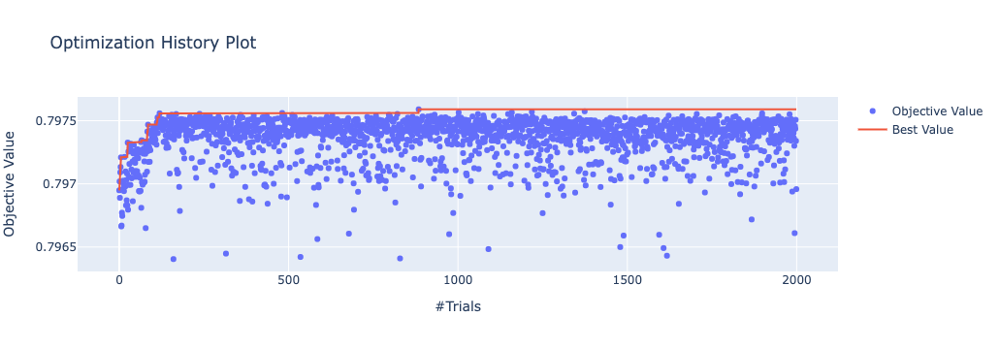

In [21]:
plot_optimization_history(study0)

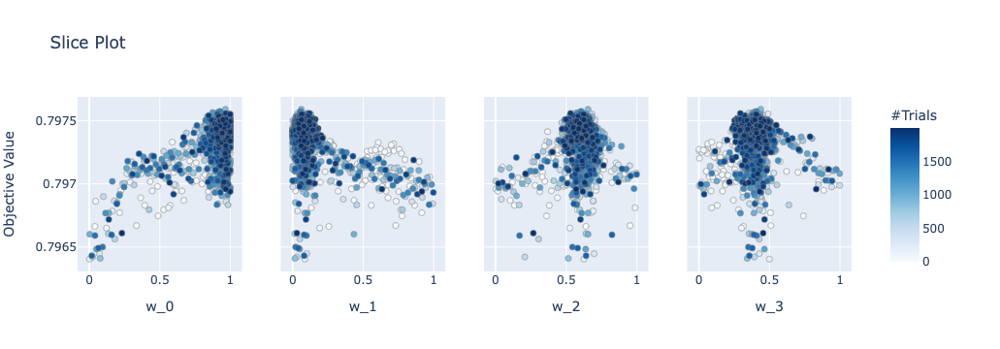

In [22]:
plot_slice(study0)

In [23]:
# rank
weights0 = np.asarray([w for w in study0.best_params.values()])
weights0 /=  weights0.sum()
weights0

array([0.45554371, 0.02918804, 0.30843194, 0.2068363 ])

***

In [24]:
%%time
study1 = compute_optimal_blend(all_dfs, on_cv=1, rank=True)

CPU times: user 8min 22s, sys: 85.8 ms, total: 8min 22s
Wall time: 8min 22s


In [25]:
print(compute_amex_metric(df1.target.values, df1.pred1.values))
print(compute_amex_metric(df2.target.values, df2.pred1.values))
print(compute_amex_metric(df4.target.values, df4.pred1.values))
print(compute_amex_metric(df5.target.values, df5.pred1.values))

0.7969035221260627
0.7963265999379039
0.7945157233237514
0.7945770862430908


In [26]:
# max: 0.800090
study1.trials_dataframe().sort_values("value", ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_w_0,params_w_1,params_w_2,params_w_3,state
670,670,0.798045,2022-08-24 18:26:03.581641,2022-08-24 18:26:03.676131,0 days 00:00:00.094490,0.983502,0.628018,0.169183,0.524302,COMPLETE
546,546,0.798032,2022-08-24 18:25:33.667433,2022-08-24 18:25:33.760314,0 days 00:00:00.092881,0.983047,0.735341,0.219255,0.580717,COMPLETE
1350,1350,0.798029,2022-08-24 18:28:54.160860,2022-08-24 18:28:54.269814,0 days 00:00:00.108954,0.946495,0.692153,0.199840,0.532023,COMPLETE
1401,1401,0.798029,2022-08-24 18:29:07.429276,2022-08-24 18:29:07.542240,0 days 00:00:00.112964,0.925978,0.670025,0.208692,0.541298,COMPLETE
1326,1326,0.798028,2022-08-24 18:28:47.878216,2022-08-24 18:28:47.987400,0 days 00:00:00.109184,0.970316,0.713916,0.221095,0.580363,COMPLETE
1528,1528,0.798028,2022-08-24 18:29:41.018650,2022-08-24 18:29:41.132142,0 days 00:00:00.113492,0.940938,0.651921,0.214809,0.572029,COMPLETE
1405,1405,0.798028,2022-08-24 18:29:08.498307,2022-08-24 18:29:08.608665,0 days 00:00:00.110358,0.878101,0.653701,0.210430,0.550740,COMPLETE
767,767,0.798028,2022-08-24 18:26:27.263788,2022-08-24 18:26:27.360842,0 days 00:00:00.097054,0.934290,0.692620,0.221688,0.583931,COMPLETE
1674,1674,0.798025,2022-08-24 18:30:19.891383,2022-08-24 18:30:20.008221,0 days 00:00:00.116838,0.890083,0.636622,0.200488,0.519340,COMPLETE
335,335,0.798024,2022-08-24 18:24:43.667787,2022-08-24 18:24:43.756570,0 days 00:00:00.088783,0.969108,0.716537,0.217865,0.567461,COMPLETE


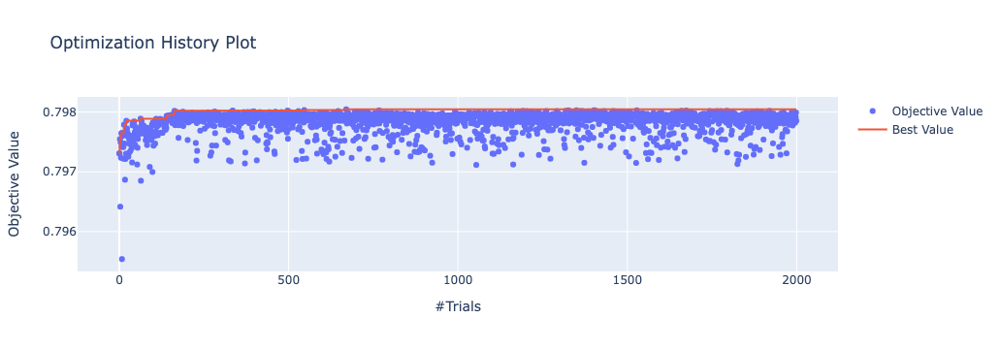

In [27]:
plot_optimization_history(study1)

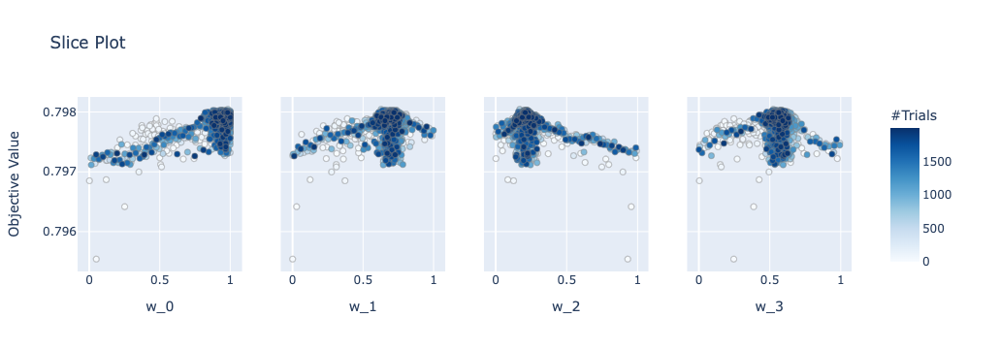

In [28]:
plot_slice(study1)

In [29]:
# rank
weights1 = np.asarray([w for w in study1.best_params.values()])
weights1 /=  weights1.sum()
weights1

array([0.42668112, 0.27245846, 0.07339803, 0.2274624 ])

***

In [30]:
%%time
study2 = compute_optimal_blend(all_dfs, on_cv=2, rank=True)

CPU times: user 8min 40s, sys: 103 ms, total: 8min 40s
Wall time: 8min 40s


In [31]:
print(compute_amex_metric(df1.target.values, df1.pred2.values))
print(compute_amex_metric(df2.target.values, df2.pred2.values))
print(compute_amex_metric(df4.target.values, df4.pred2.values))
print(compute_amex_metric(df5.target.values, df5.pred2.values))

0.7962730538882409
0.7955081896896724
0.7946359533819897
0.7948170973577932


In [32]:
# max: 0.799861
study2.trials_dataframe().sort_values("value", ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_w_0,params_w_1,params_w_2,params_w_3,state
861,861,0.797768,2022-08-24 18:35:21.295289,2022-08-24 18:35:21.395119,0 days 00:00:00.099830,0.797635,0.329416,0.362312,0.034669,COMPLETE
549,549,0.797754,2022-08-24 18:34:02.074837,2022-08-24 18:34:02.167814,0 days 00:00:00.092977,0.814672,0.328536,0.339632,0.031679,COMPLETE
237,237,0.797738,2022-08-24 18:32:46.052193,2022-08-24 18:32:46.138528,0 days 00:00:00.086335,0.840483,0.361435,0.401334,0.028230,COMPLETE
818,818,0.797737,2022-08-24 18:35:10.218707,2022-08-24 18:35:10.317420,0 days 00:00:00.098713,0.839118,0.331160,0.349221,0.033542,COMPLETE
1432,1432,0.797735,2022-08-24 18:37:51.087240,2022-08-24 18:37:51.197310,0 days 00:00:00.110070,0.800990,0.359220,0.352711,0.015517,COMPLETE
123,123,0.797734,2022-08-24 18:32:18.867844,2022-08-24 18:32:18.952711,0 days 00:00:00.084867,0.808593,0.328700,0.366352,0.034085,COMPLETE
1439,1439,0.797734,2022-08-24 18:37:52.961619,2022-08-24 18:37:53.073191,0 days 00:00:00.111572,0.783573,0.324496,0.356730,0.031972,COMPLETE
661,661,0.797733,2022-08-24 18:34:30.307985,2022-08-24 18:34:30.403924,0 days 00:00:00.095939,0.840354,0.363733,0.401248,0.026626,COMPLETE
1819,1819,0.797731,2022-08-24 18:39:38.250389,2022-08-24 18:39:38.372405,0 days 00:00:00.122016,0.844347,0.354785,0.387861,0.037758,COMPLETE
585,585,0.797724,2022-08-24 18:34:11.096694,2022-08-24 18:34:11.191852,0 days 00:00:00.095158,0.768417,0.307969,0.317047,0.026040,COMPLETE


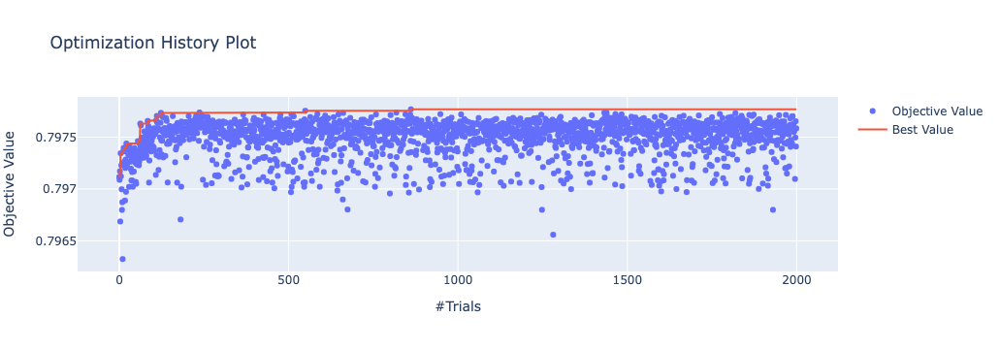

In [33]:
plot_optimization_history(study2)

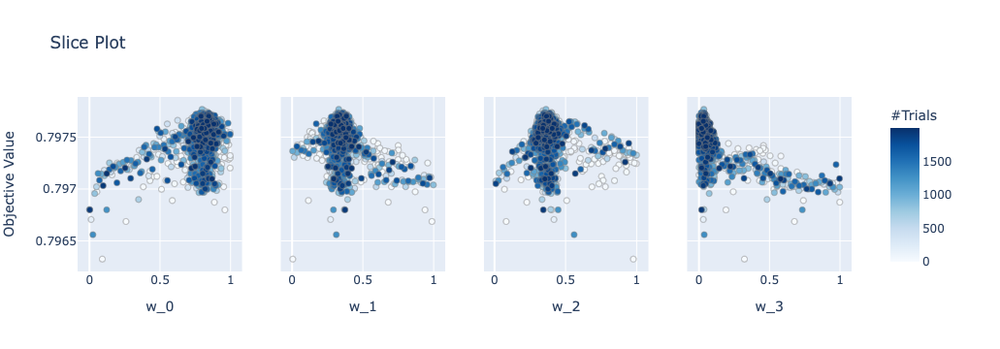

In [34]:
plot_slice(study2)

In [35]:
# rank
weights2 = np.asarray([w for w in study2.best_params.values()])
weights2 /=  weights2.sum()
weights2

array([0.52337169, 0.21614752, 0.23773256, 0.02274823])

***

In [36]:
%%time
study3 = compute_optimal_blend(all_dfs, on_cv=3, rank=True)

CPU times: user 8min 52s, sys: 125 ms, total: 8min 52s
Wall time: 8min 52s


In [37]:
print(compute_amex_metric(df1.target.values, df1.pred3.values))
print(compute_amex_metric(df2.target.values, df2.pred3.values))
print(compute_amex_metric(df4.target.values, df4.pred3.values))
print(compute_amex_metric(df5.target.values, df5.pred3.values))

0.7963205648248548
0.7956685229548981
0.7939061383997179
0.7945915498157018


In [38]:
# max: 
study3.trials_dataframe().sort_values("value", ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_w_0,params_w_1,params_w_2,params_w_3,state
808,808,0.797705,2022-08-24 18:43:54.714057,2022-08-24 18:43:54.812164,0 days 00:00:00.098107,0.624067,0.687548,0.890203,0.900883,COMPLETE
499,499,0.797703,2022-08-24 18:42:35.084668,2022-08-24 18:42:35.175943,0 days 00:00:00.091275,0.629442,0.770078,0.931112,0.974254,COMPLETE
208,208,0.797692,2022-08-24 18:41:22.254528,2022-08-24 18:41:22.340640,0 days 00:00:00.086112,0.656607,0.729655,0.932700,0.956074,COMPLETE
209,209,0.797688,2022-08-24 18:41:22.507537,2022-08-24 18:41:22.594858,0 days 00:00:00.087321,0.658796,0.725940,0.916159,0.956922,COMPLETE
353,353,0.797688,2022-08-24 18:41:58.264987,2022-08-24 18:41:58.354129,0 days 00:00:00.089142,0.628747,0.701647,0.895216,0.907959,COMPLETE
742,742,0.797688,2022-08-24 18:43:37.526029,2022-08-24 18:43:37.623400,0 days 00:00:00.097371,0.662283,0.730283,0.924869,0.963426,COMPLETE
362,362,0.797686,2022-08-24 18:42:00.511758,2022-08-24 18:42:00.600977,0 days 00:00:00.089219,0.621731,0.837444,0.877592,0.950593,COMPLETE
1240,1240,0.797685,2022-08-24 18:45:49.853478,2022-08-24 18:45:49.961956,0 days 00:00:00.108478,0.655730,0.752426,0.932477,0.932580,COMPLETE
598,598,0.797685,2022-08-24 18:43:00.405307,2022-08-24 18:43:00.499314,0 days 00:00:00.094007,0.649405,0.838696,0.903514,0.991215,COMPLETE
1598,1598,0.797685,2022-08-24 18:47:28.699425,2022-08-24 18:47:28.814285,0 days 00:00:00.114860,0.620967,0.793035,0.860421,0.945430,COMPLETE


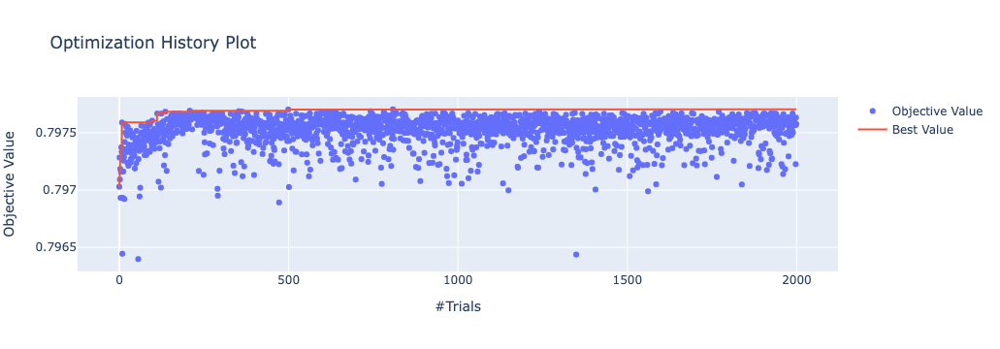

In [39]:
plot_optimization_history(study3)

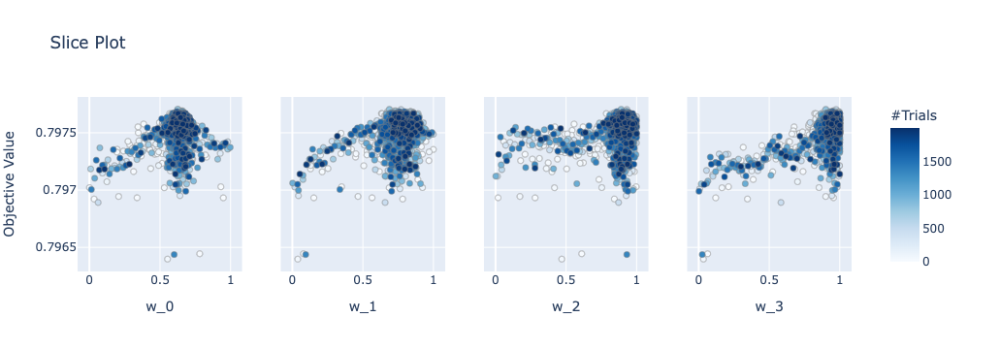

In [40]:
plot_slice(study3)

In [41]:
# rank
weights3 = np.asarray([w for w in study3.best_params.values()])
weights3 /=  weights3.sum()
weights3

array([0.20113675, 0.22159649, 0.28691232, 0.29035444])

***

In [42]:
%%time
study4 = compute_optimal_blend(all_dfs, on_cv=4, rank=True)

CPU times: user 9min 8s, sys: 107 ms, total: 9min 8s
Wall time: 9min 8s


In [43]:
print(compute_amex_metric(df1.target.values, df1.pred4.values))
print(compute_amex_metric(df2.target.values, df2.pred4.values))
print(compute_amex_metric(df4.target.values, df4.pred4.values))
print(compute_amex_metric(df5.target.values, df5.pred4.values))

0.7962432827648656
0.7965019740881618
0.7950693883578257
0.7947074425904948


In [44]:
# max: 
study4.trials_dataframe().sort_values("value", ascending=False).head(10)

,number,value,datetime_start,datetime_complete,duration,params_w_0,params_w_1,params_w_2,params_w_3,state
753,753,0.797941,2022-08-24 18:52:39.785013,2022-08-24 18:52:39.883038,0 days 00:00:00.098025,0.700066,0.760833,0.981302,0.170806,COMPLETE
775,775,0.797927,2022-08-24 18:52:45.678983,2022-08-24 18:52:45.775675,0 days 00:00:00.096692,0.621275,0.681801,0.873174,0.144345,COMPLETE
722,722,0.797927,2022-08-24 18:52:31.481424,2022-08-24 18:52:31.577517,0 days 00:00:00.096093,0.640344,0.681035,0.898774,0.152881,COMPLETE
572,572,0.797924,2022-08-24 18:51:51.841437,2022-08-24 18:51:51.935661,0 days 00:00:00.094224,0.670606,0.716677,0.928436,0.161748,COMPLETE
431,431,0.797924,2022-08-24 18:51:14.971023,2022-08-24 18:51:15.061001,0 days 00:00:00.089978,0.688257,0.758528,0.971627,0.167236,COMPLETE
283,283,0.797924,2022-08-24 18:50:36.774062,2022-08-24 18:50:36.861943,0 days 00:00:00.087881,0.660175,0.705406,0.920575,0.155303,COMPLETE
777,777,0.797920,2022-08-24 18:52:46.216476,2022-08-24 18:52:46.314409,0 days 00:00:00.097933,0.624439,0.695034,0.873330,0.144739,COMPLETE
558,558,0.797919,2022-08-24 18:51:48.202547,2022-08-24 18:51:48.297396,0 days 00:00:00.094849,0.701912,0.762679,0.997692,0.173531,COMPLETE
712,712,0.797914,2022-08-24 18:52:28.818148,2022-08-24 18:52:28.913672,0 days 00:00:00.095524,0.653343,0.721526,0.925183,0.151246,COMPLETE
553,553,0.797910,2022-08-24 18:51:46.897611,2022-08-24 18:51:46.990373,0 days 00:00:00.092762,0.708951,0.761130,0.998963,0.164635,COMPLETE


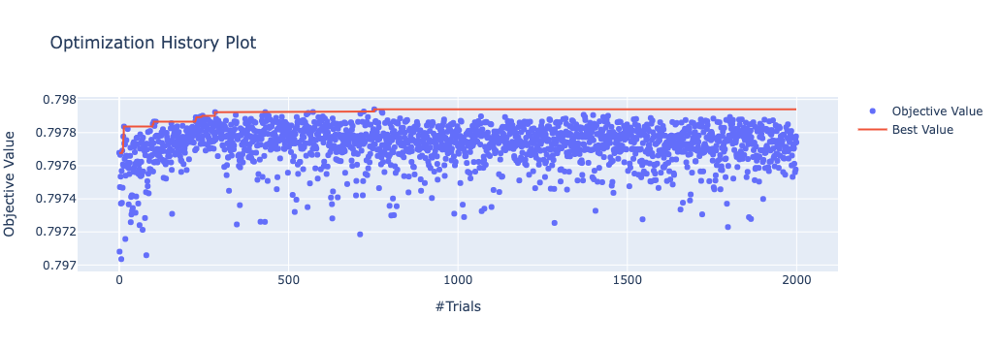

In [45]:
plot_optimization_history(study4)

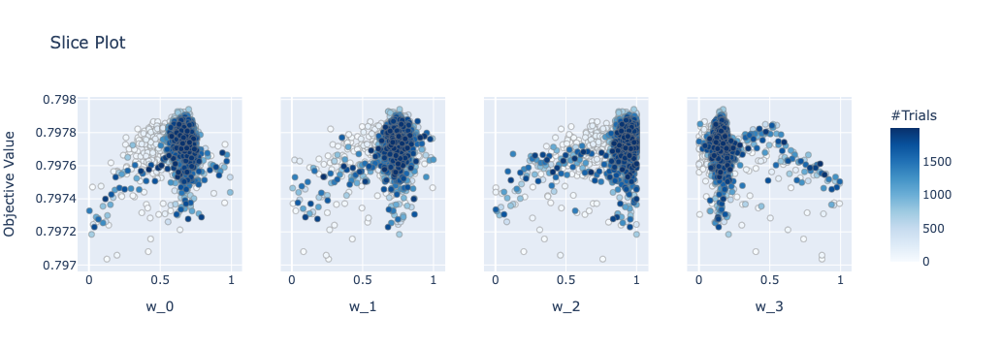

In [46]:
plot_slice(study4)

In [47]:
# rank
weights4 = np.asarray([w for w in study4.best_params.values()])
weights4 /=  weights4.sum()
weights4

array([0.26791598, 0.29117141, 0.37554509, 0.06536752])

***
## blend

In [48]:
all_weights = [weights0, weights1, weights2, weights3, weights4]
np.mean(all_weights, axis=0)

array([0.37492985, 0.20611238, 0.25640399, 0.16255378])

In [49]:
sub1 = pd.read_csv(f"../data/subs/lgbm-dart-bce-dsv{DATASET_VERSION}/submission-all.csv")
sub2 = pd.read_csv(f"../data/subs/lgbm-dart-xtree-bce-dsv{DATASET_VERSION}/submission-all.csv")
#sub3 = pd.read_csv(f"../data/subs/lgbm-dart-linear-bce-dsv{DATASET_VERSION}/submission-all.csv")
sub4 = pd.read_csv(f"../data/subs/xgboost-dsv{DATASET_VERSION}/submission-all.csv")
sub5 = pd.read_csv(f"../data/subs/catboost-dsv{DATASET_VERSION}/submission-all.csv")

In [50]:
preds = np.concatenate([
    sub1.prediction.values.reshape(-1,1),
    sub2.prediction.values.reshape(-1,1),
    #sub3.prediction.values.reshape(-1,1),
    sub4.prediction.values.reshape(-1,1),
    sub5.prediction.values.reshape(-1,1)
    ],
    axis=1
)

preds = rankdata(preds, axis=0)
preds = preds / preds.max(axis=0)

In [51]:
sub = sub1.copy()

blend0 = (preds*weights0).sum(axis=1)
blend1 = (preds*weights1).sum(axis=1)
blend2 = (preds*weights2).sum(axis=1)
blend3 = (preds*weights3).sum(axis=1)
blend4 = (preds*weights4).sum(axis=1)

sub["prediction"] = np.mean([blend0, blend1, blend2, blend3, blend4], axis=0)

In [52]:
sub.to_csv(SUB_PATH/"submission-blend.csv", index=False)

In [53]:
sub.prediction.describe()

count    924621.000000
mean          0.500001
std           0.288314
min           0.000002
25%           0.249293
50%           0.499540
75%           0.750132
max           0.999999
Name: prediction, dtype: float64

***